<a href="https://colab.research.google.com/github/chrsthper/PBA_Christhoper-Pangaribuan-NBA_App/blob/main/PBA_NBAAPP_KAYANYAINIYANGFIXDAH.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Scrap and Sentiment Analysis of NBA Reviews App

### CHRISTHOPER CARLOS PANGARIBUAN
### 5026221150


# Import Library

In [ ]:
!pip install google_play_scraper
!pip install textblob
!pip install seaborn

from google_play_scraper import app, Sort, reviews_all
import pandas as pd
import numpy as np
import sklearn
import requests
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import textblob
#from wordcloud import WordCloud
from pathlib import Path
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score

import pickle
import re
import time
import datetime                              # access to %%time, for timing individual notebook cells
import os
from PIL import Image
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

%matplotlib inline
%config InlineBackend.figure_format='retina'

plt.style.use('seaborn-v0_8')
plt.rcParams["figure.figsize"] = (15,10)

#Cleaning Data

In [ ]:
#Android App My Fitness Pal link from Google Play at
#com.nbaimd.gametime.nba2011
#The apps ID found in the link after id=com.nbaimd.gametime.nba2011
#The apps name on Google Play titled: MyFitnessPal: Calorie Counter
#Dated 11 Maret 2025: number of reviews 2.81M++

from google_play_scraper import app, Sort, reviews_all

nba_reviews = reviews_all(
   'com.nbaimd.gametime.nba2011',
  sleep_milliseconds=0, # defaults to 0
   lang='en', # defaults to 'en'
   sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

In [ ]:
# from google_play_scraper import reviews, Sort

# myfitnesspal_reviews, _ = reviews(
#     'com.myfitnesspal.android',
#     lang='en',
#     sort=Sort.NEWEST,
#     count=20000  # Hanya ambil 5000 review
# )


In [ ]:
#Save the My Fitness Pal Apps reviews into dataframe
df_nba_reviews = pd.DataFrame(np.array(nba_reviews), columns=['content'])
df_nba_reviews = df_nba_reviews.join(pd.DataFrame(df_nba_reviews.pop('content').tolist()))
df_nba_reviews.to_csv(r'df_nba.csv', index=False)

In [ ]:
df_nba_reviews  # Menampilkan seluruh dataframe

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,7a687c75-f689-4b6c-98b9-cd80becd661f,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,I like this because it's made with like MS and...,5,0,0.60.0,2025-03-17 00:52:41,We appreciate your 5-star review! Your feedbac...,2025-03-17 01:02:26,0.60.0
1,9a4f713d-431f-4477-bb64-f2b0e297367c,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,this app is awesome... especially when it come...,5,0,None,2025-03-16 22:27:24,Thank you for the kind words and 5-star review...,2025-03-16 23:04:18,None
2,9edfac52-b94a-4946-a90f-92f00f5571ea,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,So frustrating it keeps logging you out randomly,1,0,0.60.0.20250311174644,2025-03-16 20:01:54,We are sorry for the trouble and that you are ...,2025-03-16 20:25:27,0.60.0.20250311174644
3,5ecc5418-d421-4452-a0fa-c12614231eba,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Turned all notifications in the app off to try...,1,0,None,2025-03-16 19:19:30,Thank you for the feedback and we are sorry yo...,2025-03-16 19:48:59,None
4,0d6f69d8-af90-46c9-849d-7bd65c8e74a5,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,"amazing experience, the only downside is you h...",4,0,0.60.0,2025-03-16 14:57:18,Thank you for the feedback. Please update your...,2025-03-16 15:27:34,0.60.0
...,...,...,...,...,...,...,...,...,...,...,...
24082,cdd6b19c-718f-4f9e-a731-b992ebbfe594,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,"Video is awesome, but unable to log in as only...",4,2,3.1223,2011-12-24 21:06:38,None,NaT,3.1223
24083,027eddff-cca2-4dd7-99ac-e8c6abdcdc46,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Downloaded the app onto my Huawei 7-inch table...,3,3,3.1223,2011-12-24 15:54:24,None,NaT,3.1223
24084,02e5c1c7-ce20-4c85-ac42-a1fbd56aaeef,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,I've purchased league pass / NBA.TV already an...,2,1,3.1223,2011-12-24 12:40:55,None,NaT,3.1223
24085,a123dc85-0135-448a-a055-884a71830085,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Can't wait for the season to start!,5,0,3.1223,2011-12-24 07:49:12,None,NaT,3.1223


In [ ]:
# Informasi pada tabel
df_nba = df_nba_reviews.copy()

# Menambahkan kolom 'id' sebagai increment
df_nba['id'] = range(1, len(df_nba) + 1)

# Menampilkan informasi dataframe
df_nba.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24087 entries, 0 to 24086
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   reviewId              24087 non-null  object        
 1   userName              24087 non-null  object        
 2   userImage             24087 non-null  object        
 3   content               24021 non-null  object        
 4   score                 24087 non-null  int64         
 5   thumbsUpCount         24087 non-null  int64         
 6   reviewCreatedVersion  18140 non-null  object        
 7   at                    24087 non-null  datetime64[ns]
 8   replyContent          16367 non-null  object        
 9   repliedAt             16367 non-null  datetime64[ns]
 10  appVersion            18140 non-null  object        
 11  id                    24087 non-null  int64         
dtypes: datetime64[ns](2), int64(3), object(7)
memory usage: 2.2+ MB


In [ ]:
# Drop kolom yang tidak diperlukan, hanya menyisakan kolom yang dibutuhkan
df_nba = df_nba[['id', 'content', 'score', 'thumbsUpCount', 'reviewCreatedVersion', 'at']]

# Menampilkan dataframe hasil
df_nba

,id,content,score,thumbsUpCount,reviewCreatedVersion,at
0,1,I like this because it's made with like MS and...,5,0,0.60.0,2025-03-17 00:52:41
1,2,this app is awesome... especially when it come...,5,0,None,2025-03-16 22:27:24
2,3,So frustrating it keeps logging you out randomly,1,0,0.60.0.20250311174644,2025-03-16 20:01:54
3,4,Turned all notifications in the app off to try...,1,0,None,2025-03-16 19:19:30
4,5,"amazing experience, the only downside is you h...",4,0,0.60.0,2025-03-16 14:57:18
...,...,...,...,...,...,...
24082,24083,"Video is awesome, but unable to log in as only...",4,2,3.1223,2011-12-24 21:06:38
24083,24084,Downloaded the app onto my Huawei 7-inch table...,3,3,3.1223,2011-12-24 15:54:24
24084,24085,I've purchased league pass / NBA.TV already an...,2,1,3.1223,2011-12-24 12:40:55
24085,24086,Can't wait for the season to start!,5,0,3.1223,2011-12-24 07:49:12


##Step 1 - Remove Zero Scores from User Ratings

In [ ]:
# Menghapus baris dengan nilai score = 0
df_nba = df_nba[df_nba['score'] != 0]

In [ ]:
#Check number of reviews scores
df_nba['score'].value_counts()

,count
score,
1,9564
5,9292
2,1936
4,1760
3,1535


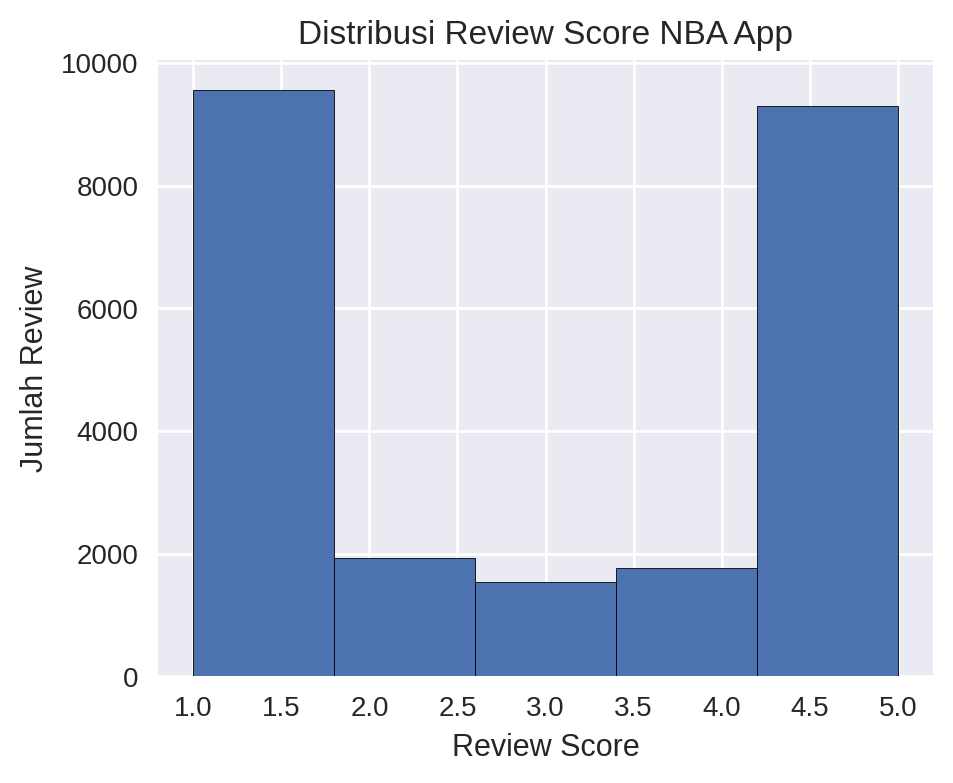

In [ ]:
# Menampilkan review score ke dalam bar chart
#plt.figure(figsize=[5,4])
#plt.hist(df_hdrev['score'])
#plt.show()

# Menampilkan distribusi review score dalam bentuk histogram
plt.figure(figsize=[5, 4])
plt.hist(df_nba['score'], bins=5, edgecolor='black')  # Menambahkan batas agar lebih jelas
plt.xlabel('Review Score')
plt.ylabel('Jumlah Review')
plt.title('Distribusi Review Score NBA App')
plt.show()

##Step 2 - Remove Empty Review

In [ ]:
# Menghapus review yang kosong atau NaN pada kolom 'content'
df_nba = df_nba.dropna(subset=['content'])  # Hapus NaN
df_nba = df_nba[df_nba['content'].str.strip() != '']  # Hapus string kosong setelah di-trim


In [ ]:
# Memeriksa apakah masih ada review kosong
df_nba[df_nba['content'].str.strip() == '']

,id,content,score,thumbsUpCount,reviewCreatedVersion,at


##Step 3 - Hapus review selain bahasa inggris

In [ ]:
print(df_nba_reviews['content'][0])

I like this because it's made with like MS and HS language that makes it entertaining for me


In [ ]:
!pip install langdetect

In [ ]:
from langdetect import detect, LangDetectException
import pandas as pd
from collections import Counter

def detect_language(text):
    try:
        return detect(str(text))  # Pastikan teks dalam bentuk string
    except LangDetectException:
        return 'unknown'  # Jika error, kembalikan 'unknown'

# Terapkan fungsi ke kolom 'content'
df_nba['language'] = df_nba['content'].fillna('').apply(detect_language)

In [ ]:
# Hitung jumlah review berdasarkan bahasa
language_counts = Counter(df_nba['language'])
language_df = pd.DataFrame.from_dict(language_counts, orient='index', columns=['count'])
language_df.index.name = 'language'
language_df = language_df.sort_values(by=['count'], ascending=False).reset_index()

# Filter hanya review yang berbahasa Inggris
df_nba = df_nba[df_nba['language'] == 'en']

# Hapus kolom 'language' setelah digunakan
df_nba.drop(columns=['language'], inplace=True)

# Tampilkan distribusi bahasa
language_df


<ipython-input-16-97540d1ebf65>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nba.drop(columns=['language'], inplace=True)


,language,count
0,en,18639
1,so,770
2,af,679
3,ro,420
4,tl,276
5,it,274
6,no,267
7,sl,258
8,fr,239
9,pl,218


In [ ]:
df_nba.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18639 entries, 0 to 24086
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    18639 non-null  int64         
 1   content               18639 non-null  object        
 2   score                 18639 non-null  int64         
 3   thumbsUpCount         18639 non-null  int64         
 4   reviewCreatedVersion  15165 non-null  object        
 5   at                    18639 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 1019.3+ KB


In [ ]:
# print(df_nba['content'][500])  # Opsional, hanya jika ingin mengecek indeks tertentu

try:
    print(df_nba['content'][0])
except (KeyError, IndexError):
    print("content sudah dihapus")

I like this because it's made with like MS and HS language that makes it entertaining for me


#Data Preprocessing

In [ ]:
!pip install emoji
!pip install wordcloud

import numpy as np
import pandas as pd
pd.set_option("display.max_colwidth", 200)
#from pandas_profiling import ProfileReport
import regex
import nltk
import wordcloud
import textblob

from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

import string
import re
import emoji

## Step 3 - Sentiment Polarity and Subjective Before Preprocessing

In [ ]:
#Creating polarity on the column: content (review from the apps) using TextBlob
#Read https://textblob.readthedocs.io/en/dev/quickstart.html

# Handle None values in 'content' column by replacing them with empty strings
df_nba['sentiment_polarity'] = df_nba['content'].astype(str).apply(lambda x: TextBlob(x).polarity)
df_nba['sentiment_subjective'] = df_nba['content'].astype(str).apply(lambda x: TextBlob(x).subjectivity)

In [ ]:
#df_hdrev.loc[:,["content","score","sentiment_polarity", "sentiment_subjective","at"]]
df_nba.loc[:, ["id", "content", "score", "sentiment_polarity", "sentiment_subjective"]]

,id,content,score,sentiment_polarity,sentiment_subjective
0,1,I like this because it's made with like MS and HS language that makes it entertaining for me,5,0.500000,0.700000
1,2,this app is awesome... especially when it comes to the fact that I can watch the highlights of the games I missed 🤭😊,5,0.500000,1.000000
2,3,So frustrating it keeps logging you out randomly,1,-0.450000,0.700000
3,4,Turned all notifications in the app off to try and stop these awful 'moments' notifications. This only worked to stop any notification I might have been interested in (breaking news) and failed to...,1,-0.312500,0.700000
4,5,"amazing experience, the only downside is you have to pay to watch some games",4,0.300000,0.950000
...,...,...,...,...,...
24082,24083,"Video is awesome, but unable to log in as only shows username field.",4,0.166667,0.833333
24083,24084,"Downloaded the app onto my Huawei 7-inch table. But when I went to log in onto my NBA account the page could not show up fully, and I could only see the USERNAME box. Hope this is fixed soon, th...",3,0.033333,0.433333
24084,24085,I've purchased league pass / NBA.TV already and ive been impatiently waiting for the app. I've got high hopes it will meet expectations later but right now it misses the mark. Not optimized for my...,2,0.149143,0.495143
24085,24086,Can't wait for the season to start!,5,0.000000,0.000000


In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_nba.loc[:, 'sentiment_rating'] = df_nba['score'].apply(lambda x: 'Positive' if x > 3 else ('Neutral' if x == 3 else 'Negative'))

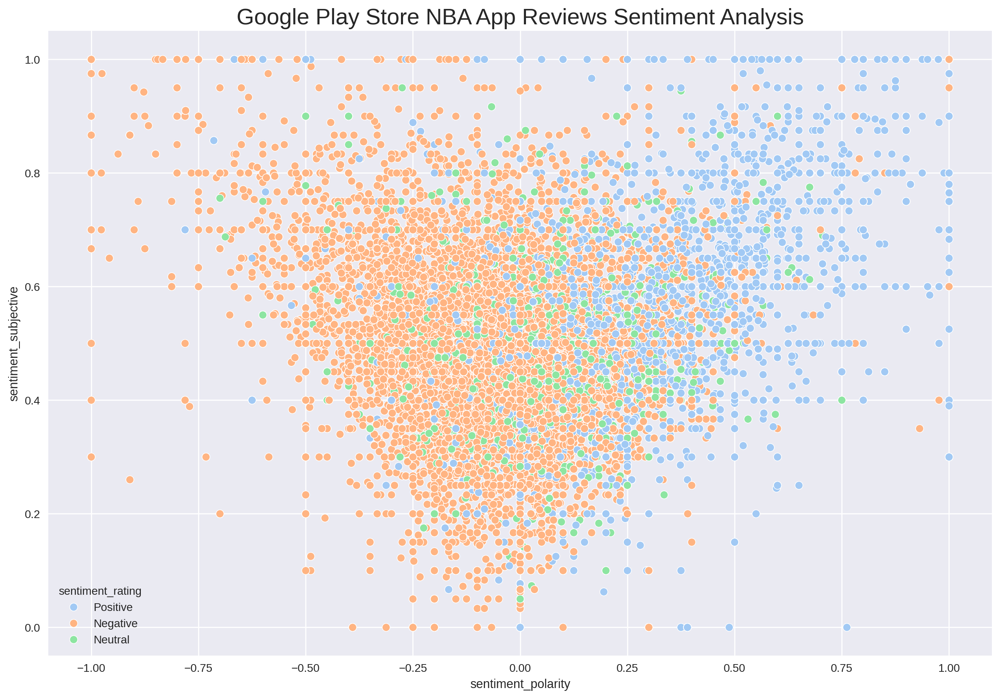

In [ ]:
plt.figure(figsize=(15, 10))

# Scatter plot analisis sentimen NBA reviews
sns.scatterplot(x=df_nba['sentiment_polarity'],
                y=df_nba['sentiment_subjective'],
                hue=df_nba['sentiment_rating'],
                edgecolor='white',
                palette="pastel")

plt.title("Google Play Store NBA App Reviews Sentiment Analysis", fontsize=20)
plt.show()


## Step 4 - Remove Special Characters (Emoji)

In [ ]:
# print(df_hdrev_raw['content'][1])
# print(df_hdrev_raw['content'][28])
# print(df_hdrev_raw['content'][234])

In [ ]:
import re

# Fungsi untuk menghapus emoji dari teks
def remove_emojis(text):
    emoji_pattern = re.compile(
        "["
        u"\U0001F600-\U0001F64F"  # Emoticons
        u"\U0001F300-\U0001F5FF"  # Simbol & Piktograf
        u"\U0001F680-\U0001F6FF"  # Simbol Transportasi & Peta
        u"\U0001F1E0-\U0001F1FF"  # Bendera (iOS)
        u"\U00002500-\U00002BEF"  # Karakter Cina
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"  # Simbol Unicode tambahan
        u"\u2640-\u2642"  # Simbol Gender
        u"\u2600-\u2B55"  # Simbol Lainnya
        u"\u200d"  # Zero Width Joiner
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # Dingbats
        u"\u3030"
        "]+", flags=re.UNICODE
    )
    return emoji_pattern.sub(r'', text) if isinstance(text, str) else text  # Hanya proses jika teks

# Terapkan fungsi remove_emojis ke kolom 'content'
df_nba.loc[:, 'content'] = df_nba['content'].astype(str).apply(remove_emojis)

In [ ]:
print(df_nba['content'][1])
print(df_nba['content'][28])
print(df_nba['content'][234])


this app is awesome... especially when it comes to the fact that I can watch the highlights of the games I missed 
love this app!!!
Thieves. They farm out geolocation to a third party so you get fked over unless you have a static IP. So I can still watch games on my mobile (cell data), but can't use my home wi-fi. Every year I swear I won't subscribe again but this time it's a done deal. There are too many alternatives available to put up with shoddy "premium" service.


## Step 5 - Lower Case the Content

In [ ]:
print(df_nba_reviews['content'][5])
print(df_nba_reviews['content'][50])

I can watch the NBA now.
nice


In [ ]:
# Mengubah tipe data kolom content menjadi string
df_nba.loc[:, 'content'] = df_nba['content'].astype(str)

In [ ]:
# # Mengubah semua teks di kolom 'content' menjadi huruf kecil
df_nba.loc[:, 'content'] = df_nba['content'].apply(lambda x: x.lower())
# print(df_hdrev['content'][5])
# print(df_hdrev['content'][55])

## Step 1 - Tokenizing

In [ ]:
import nltk
import os
import shutil

# Hapus cache NLTK
nltk_data_path = os.path.expanduser('~/nltk_data')
if os.path.exists(nltk_data_path):
    shutil.rmtree(nltk_data_path)  # Hapus semua data NLTK

# Download ulang 'punkt'
nltk.download('punkt')

# Paksa NLTK mencari ulang lokasi tokenizers
nltk.data.find('tokenizers/punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


FileSystemPathPointer('/root/nltk_data/tokenizers/punkt')

In [ ]:
import nltk
# Download the missing 'punkt_tab' data package
nltk.download('punkt_tab')

from nltk.tokenize import word_tokenize

# Pastikan df_nba adalah salinan independen
df_nba = df_nba.copy()

# Tokenisasi kolom 'content'
df_nba['token'] = df_nba['content'].apply(lambda x: word_tokenize(str(x)))

# Tampilkan dataframe dengan token
display(df_nba[['content', 'token']])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


,content,token
0,i like this because it's made with like ms and hs language that makes it entertaining for me,"[i, like, this, because, it, 's, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]"
1,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,"[this, app, is, awesome, ..., especially, when, it, comes, to, the, fact, that, i, can, watch, the, highlights, of, the, games, i, missed]"
2,so frustrating it keeps logging you out randomly,"[so, frustrating, it, keeps, logging, you, out, randomly]"
3,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, 'moments, ', notifications, ., this, only, worked, to, stop, any, notification, i, might, have, been, interested, ..."
4,"amazing experience, the only downside is you have to pay to watch some games","[amazing, experience, ,, the, only, downside, is, you, have, to, pay, to, watch, some, games]"
...,...,...
24082,"video is awesome, but unable to log in as only shows username field.","[video, is, awesome, ,, but, unable, to, log, in, as, only, shows, username, field, .]"
24083,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...","[downloaded, the, app, onto, my, huawei, 7-inch, table, ., but, when, i, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, ,, and, i, could, only, see, the, userna..."
24084,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,"[i, 've, purchased, league, pass, /, nba.tv, already, and, ive, been, impatiently, waiting, for, the, app, ., i, 've, got, high, hopes, it, will, meet, expectations, later, but, right, now, it, mi..."
24085,can't wait for the season to start!,"[ca, n't, wait, for, the, season, to, start, !]"


##Expand Contractions

In [ ]:
!pip install spacy
!pip install contractions
import spacy
import contractions

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.3/118.3 kB 8.3 MB/s eta 0:00:00


In [ ]:
import nltk
from nltk.tokenize import word_tokenize
import contractions

def expand_contractions(text):
    # Pastikan teks bukan None atau NaN sebelum diproses
    if isinstance(text, str) and len(text) > 0:
        try:
            return contractions.fix(text)  # Ekspansi kontraksi
        except IndexError:
            return text  # Jika terjadi error, kembalikan teks asli
    return text

# Terapkan ekspansi kontraksi ke kolom 'content'
df_nba['expanded_content'] = df_nba['content'].apply(expand_contractions)

# Tokenisasi setelah kontraksi diperluas
df_nba['token'] = df_nba['expanded_content'].apply(word_tokenize)

# Tampilkan hasil
display(df_nba[['content', 'expanded_content', 'token']])

,content,expanded_content,token
0,i like this because it's made with like ms and hs language that makes it entertaining for me,i like this because it is made with like ms and hs language that makes it entertaining for me,"[i, like, this, because, it, is, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]"
1,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,"[this, app, is, awesome, ..., especially, when, it, comes, to, the, fact, that, i, can, watch, the, highlights, of, the, games, i, missed]"
2,so frustrating it keeps logging you out randomly,so frustrating it keeps logging you out randomly,"[so, frustrating, it, keeps, logging, you, out, randomly]"
3,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, 'moments, ', notifications, ., this, only, worked, to, stop, any, notification, i, might, have, been, interested, ..."
4,"amazing experience, the only downside is you have to pay to watch some games","amazing experience, the only downside is you have to pay to watch some games","[amazing, experience, ,, the, only, downside, is, you, have, to, pay, to, watch, some, games]"
...,...,...,...
24082,"video is awesome, but unable to log in as only shows username field.","video is awesome, but unable to log in as only shows username field.","[video, is, awesome, ,, but, unable, to, log, in, as, only, shows, username, field, .]"
24083,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...","downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...","[downloaded, the, app, onto, my, huawei, 7-inch, table, ., but, when, i, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, ,, and, i, could, only, see, the, userna..."
24084,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,i have purchased league pass / nba.tv already and i have been impatiently waiting for the app. i have got high hopes it will meet expectations later but right now it misses the mark. not optimized...,"[i, have, purchased, league, pass, /, nba.tv, already, and, i, have, been, impatiently, waiting, for, the, app, ., i, have, got, high, hopes, it, will, meet, expectations, later, but, right, now, ..."
24085,can't wait for the season to start!,cannot wait for the season to start!,"[can, not, wait, for, the, season, to, start, !]"


##Punctuations Removal

In [ ]:
import re
import string
def cleaning_text(text):
    # Menambah spasi setelah koma jika tidak ada spasi
    text = re.sub(r",(?!\s)", ", ", text)
    # Menghapus tab, newline, backslash
    text = text.replace('\\t', " ").replace('\\n', " ").replace('\\u', " ").replace('\\', "")
    # Menghapus karakter non-ASCII (emoticon, huruf Cina, dll.)
    text = text.encode('ascii', 'replace').decode('ascii')
    # Menghapus URL
    text = re.sub(r"(?i)(?:https?:\/\/)?(?:www\.)?(?:[a-zA-Z0-9-.]+)(?:\.[a-zA-Z]{2,6})(?:\/[^\s\r\n]*)?", "", text)
    # Menghapus angka
    text = re.sub(r"\d+", "", text)
    # Menghapus tanda baca
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Menghapus whitespace berlebih dan karakter tunggal
    text = text.strip()
    text = re.sub('\s+', ' ', text)
    return re.sub(r"\b[a-zA-Z]\b", "", text)

# Terapkan fungsi pembersihan ke kolom content
df_nba['cleaned_content'] = df_nba['content'].astype(str).apply(cleaning_text)

# Tokenisasi setelah teks dibersihkan
df_nba['token'] = df_nba['cleaned_content'].apply(word_tokenize)

In [ ]:
df_nba.loc[:, ["content", "cleaned_content", "token"]]

,content,cleaned_content,token
0,i like this because it's made with like ms and hs language that makes it entertaining for me,like this because its made with like ms and hs language that makes it entertaining for me,"[like, this, because, its, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]"
1,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,this app is awesome especially when it comes to the fact that can watch the highlights of the games missed,"[this, app, is, awesome, especially, when, it, comes, to, the, fact, that, can, watch, the, highlights, of, the, games, missed]"
2,so frustrating it keeps logging you out randomly,so frustrating it keeps logging you out randomly,"[so, frustrating, it, keeps, logging, you, out, randomly]"
3,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turned all notifications in the app off to try and stop these awful moments notifications this only worked to stop any notification might have been interested in breaking news and failed to stop ...,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, moments, notifications, this, only, worked, to, stop, any, notification, might, have, been, interested, in, breaki..."
4,"amazing experience, the only downside is you have to pay to watch some games",amazing experience the only downside is you have to pay to watch some games,"[amazing, experience, the, only, downside, is, you, have, to, pay, to, watch, some, games]"
...,...,...,...
24082,"video is awesome, but unable to log in as only shows username field.",video is awesome but unable to log in as only shows username field,"[video, is, awesome, but, unable, to, log, in, as, only, shows, username, field]"
24083,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...",downloaded the app onto my huawei inch table but when went to log in onto my nba account the page could not show up fully and could only see the username box hope this is fixed soon the season i...,"[downloaded, the, app, onto, my, huawei, inch, table, but, when, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, and, could, only, see, the, username, box, hope,..."
24084,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,ive purchased league pass already and ive been impatiently waiting for the app ive got high hopes it will meet expectations later but right now it misses the mark not optimized for my xoomtablets ...,"[ive, purchased, league, pass, already, and, ive, been, impatiently, waiting, for, the, app, ive, got, high, hopes, it, will, meet, expectations, later, but, right, now, it, misses, the, mark, not..."
24085,can't wait for the season to start!,cant wait for the season to start,"[cant, wait, for, the, season, to, start]"


##Before Stopwords removal

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
def freq_words(x, terms=30):
    all_words = ' '.join(text for text in x)
    all_words = all_words.split()

    word_counts = Counter(all_words)  # Hitung frekuensi kata
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Pilih kata dengan frekuensi tertinggi
    d = words_df.nlargest(columns="count", n=terms)

    plt.figure(figsize=(20, 5))
    ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))
    ax.set(ylabel='Count')
    plt.xticks(rotation=45)  # Memiringkan label agar lebih mudah dibaca
    plt.show()

<ipython-input-38-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


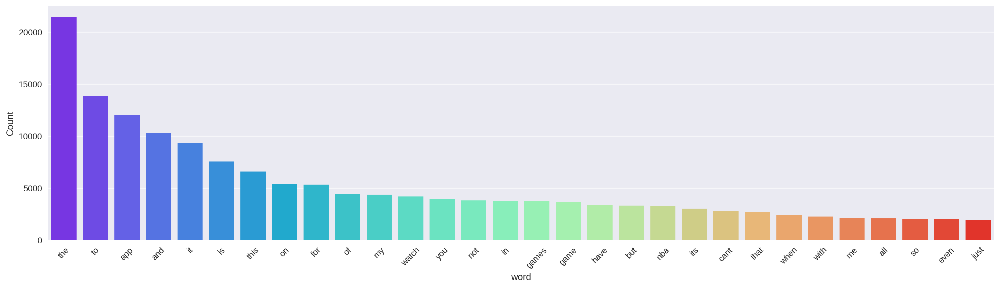

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_nba['cleaned_content'])

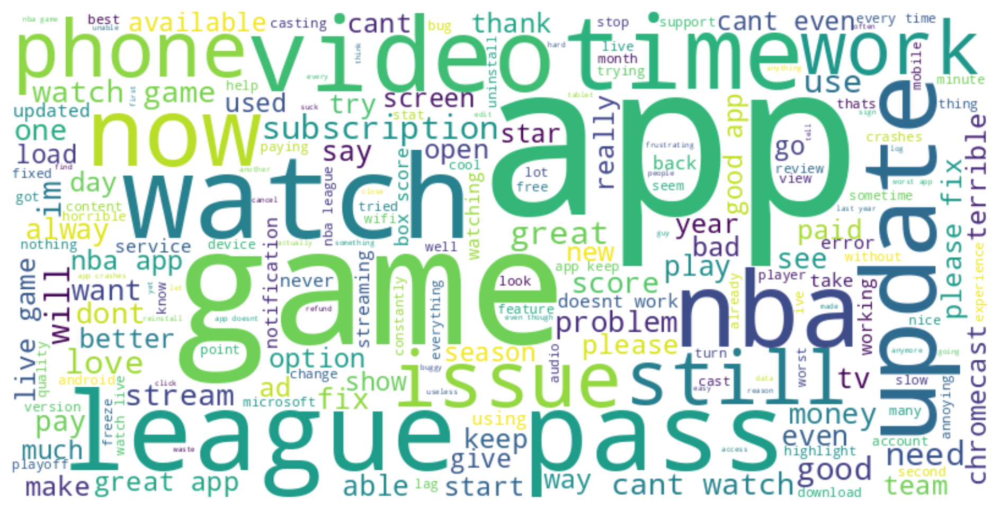

In [ ]:
# Gabungkan semua teks dalam kolom 'cleaned_content' menjadi satu string
all_words_after = ' '.join(df_nba['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Tampilkan WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()


##Stopword Removal

In [ ]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Ambil daftar stopwords bahasa Inggris
english_stopwords = set(stopwords.words('english'))  # Gunakan set untuk akses lebih cepat

# Tambahkan kata tambahan ke dalam stopwords
english_stopwords.update(['app', 'used'])  # update() lebih efisien dibanding extend()

# Terapkan stopword removal ke setiap list token
df_nba["token_after_sr"] = df_nba["token"].apply(lambda tokens: [word for word in tokens if isinstance(tokens, list) and word not in english_stopwords and word.isalpha()])

# Gabungkan token menjadi teks yang bersih dalam kolom cleaned_content
df_nba["cleaned_content"] = df_nba["token_after_sr"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan hasil
display(df_nba[['content', 'cleaned_content', 'token', 'token_after_sr']])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,content,cleaned_content,token,token_after_sr
0,i like this because it's made with like ms and hs language that makes it entertaining for me,like made like ms hs language makes entertaining,"[like, this, because, its, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]","[like, made, like, ms, hs, language, makes, entertaining]"
1,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,awesome especially comes fact watch highlights games missed,"[this, app, is, awesome, especially, when, it, comes, to, the, fact, that, can, watch, the, highlights, of, the, games, missed]","[awesome, especially, comes, fact, watch, highlights, games, missed]"
2,so frustrating it keeps logging you out randomly,frustrating keeps logging randomly,"[so, frustrating, it, keeps, logging, you, out, randomly]","[frustrating, keeps, logging, randomly]"
3,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turned notifications try stop awful moments notifications worked stop notification might interested breaking news failed stop notifications never wanted never agreed tried disable,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, moments, notifications, this, only, worked, to, stop, any, notification, might, have, been, interested, in, breaki...","[turned, notifications, try, stop, awful, moments, notifications, worked, stop, notification, might, interested, breaking, news, failed, stop, notifications, never, wanted, never, agreed, tried, d..."
4,"amazing experience, the only downside is you have to pay to watch some games",amazing experience downside pay watch games,"[amazing, experience, the, only, downside, is, you, have, to, pay, to, watch, some, games]","[amazing, experience, downside, pay, watch, games]"
...,...,...,...,...
24082,"video is awesome, but unable to log in as only shows username field.",video awesome unable log shows username field,"[video, is, awesome, but, unable, to, log, in, as, only, shows, username, field]","[video, awesome, unable, log, shows, username, field]"
24083,"downloaded the app onto my huawei 7-inch table. but when i went to log in onto my nba account the page could not show up fully, and i could only see the username box. hope this is fixed soon, th...",downloaded onto huawei inch table went log onto nba account page could show fully could see username box hope fixed soon season starting couple days,"[downloaded, the, app, onto, my, huawei, inch, table, but, when, went, to, log, in, onto, my, nba, account, the, page, could, not, show, up, fully, and, could, only, see, the, username, box, hope,...","[downloaded, onto, huawei, inch, table, went, log, onto, nba, account, page, could, show, fully, could, see, username, box, hope, fixed, soon, season, starting, couple, days]"
24084,i've purchased league pass / nba.tv already and ive been impatiently waiting for the app. i've got high hopes it will meet expectations later but right now it misses the mark. not optimized for my...,ive purchased league pass already ive impatiently waiting ive got high hopes meet expectations later right misses mark optimized xoomtablets cant even see boxes login account nba put better stuff,"[ive, purchased, league, pass, already, and, ive, been, impatiently, waiting, for, the, app, ive, got, high, hopes, it, will, meet, expectations, later, but, right, now, it, misses, the, mark, not...","[ive, purchased, league, pass, already, ive, impatiently, waiting, ive, got, high, hopes, meet, expectations, later, right, misses, mark, optimized, xoomtablets, cant, even, see, boxes, login, acc..."
24085,can't wait for the season to start!,cant wait season start,"[cant, wait, for, the, season, to, start]","[cant, wait, season, start]"


In [ ]:
df_nba.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr
0,1,i like this because it's made with like ms and hs language that makes it entertaining for me,5,0,0.60.0,2025-03-17 00:52:41,0.5000,0.70,Positive,"[like, this, because, its, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]",i like this because it is made with like ms and hs language that makes it entertaining for me,like made like ms hs language makes entertaining,"[like, made, like, ms, hs, language, makes, entertaining]"
1,2,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,5,0,None,2025-03-16 22:27:24,0.5000,1.00,Positive,"[this, app, is, awesome, especially, when, it, comes, to, the, fact, that, can, watch, the, highlights, of, the, games, missed]",this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,awesome especially comes fact watch highlights games missed,"[awesome, especially, comes, fact, watch, highlights, games, missed]"
2,3,so frustrating it keeps logging you out randomly,1,0,0.60.0.20250311174644,2025-03-16 20:01:54,-0.4500,0.70,Negative,"[so, frustrating, it, keeps, logging, you, out, randomly]",so frustrating it keeps logging you out randomly,frustrating keeps logging randomly,"[frustrating, keeps, logging, randomly]"
3,4,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,1,0,None,2025-03-16 19:19:30,-0.3125,0.70,Negative,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, moments, notifications, this, only, worked, to, stop, any, notification, might, have, been, interested, in, breaki...",turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turned notifications try stop awful moments notifications worked stop notification might interested breaking news failed stop notifications never wanted never agreed tried disable,"[turned, notifications, try, stop, awful, moments, notifications, worked, stop, notification, might, interested, breaking, news, failed, stop, notifications, never, wanted, never, agreed, tried, d..."
4,5,"amazing experience, the only downside is you have to pay to watch some games",4,0,0.60.0,2025-03-16 14:57:18,0.3000,0.95,Positive,"[amazing, experience, the, only, downside, is, you, have, to, pay, to, watch, some, games]","amazing experience, the only downside is you have to pay to watch some games",amazing experience downside pay watch games,"[amazing, experience, downside, pay, watch, games]"


<ipython-input-38-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


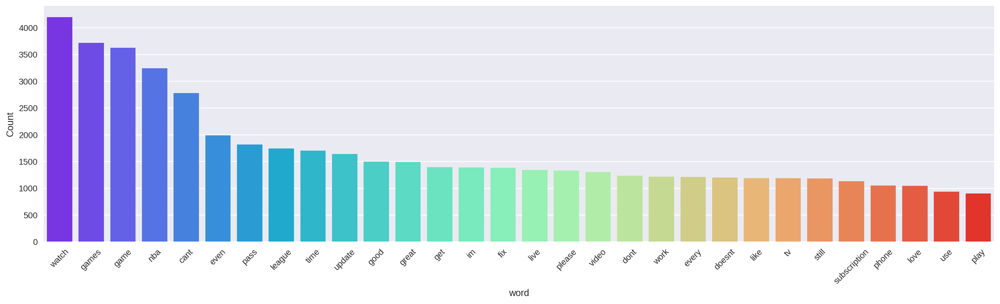

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_nba['cleaned_content'])

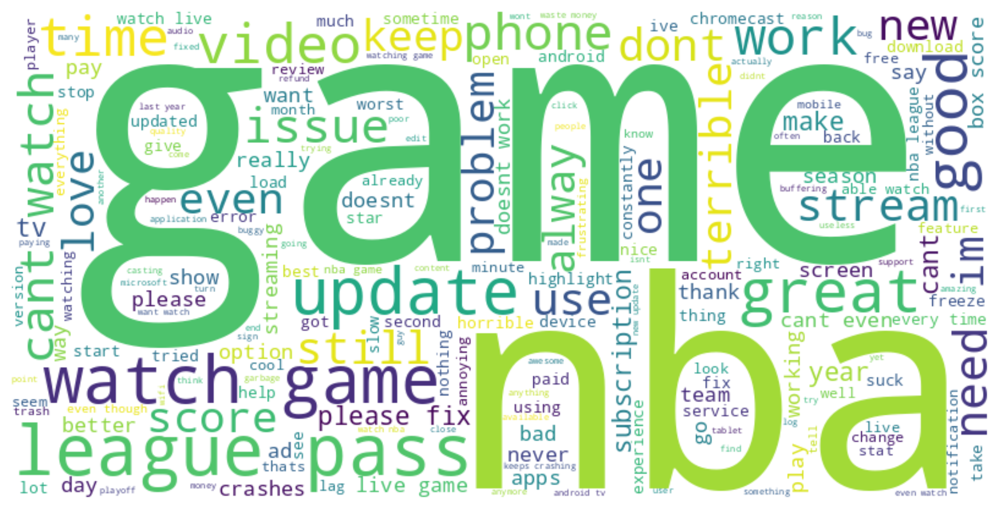

In [ ]:
# Gabungkan semua teks dalam kolom 'cleaned_content' menjadi satu string
all_words_after = ' '.join(df_nba['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Tampilkan WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()


##Stemming & Lemmatization

In [ ]:
import nltk

# Download the necessary NLTK data packages
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('universal_tagset')

from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk import pos_tag

lemmatizer = WordNetLemmatizer()

# Function to get the Part of Speech (POS) for more accurate lemmatization
def get_wordnet_pos(word):
    tag = pos_tag([word])[0][1][0].upper()  # Get the first letter of the POS tag
    tag_dict = {"J": wordnet.ADJ, "N": wordnet.NOUN, "V": wordnet.VERB, "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)  # Default to NOUN if not found

# Function for lemmatization with POS tagging
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in tokens]

# Apply lemmatization to token_after_sr
df_nba["token_after_lemma"] = df_nba["token_after_sr"].apply(lemmatize_tokens)

# Gabungkan kembali token menjadi teks bersih setelah lemmatization
df_nba["cleaned_content"] = df_nba["token_after_lemma"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan DataFrame dengan semua kolom, tetapi tanpa stemming
df_nba = df_nba.drop(columns=["token_after_stem"])  # Hapus kolom stemming

# Tampilkan dataframe dengan format awal yang sama
display(df_nba)

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_rwr
0,1,i like this because it's made with like ms and hs language that makes it entertaining for me,5,0,0.60.0,2025-03-17 00:52:41,0.500000,0.700000,Positive,"[like, this, because, its, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]",i like this because it is made with like ms and hs language that makes it entertaining for me,like make like m h language make entertain,"[like, made, like, ms, hs, language, makes, entertaining]","[like, make, like, m, h, language, make, entertain]",[]
1,2,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,5,0,None,2025-03-16 22:27:24,0.500000,1.000000,Positive,"[this, app, is, awesome, especially, when, it, comes, to, the, fact, that, can, watch, the, highlights, of, the, games, missed]",this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,awesome especially come fact watch highlight game miss,"[awesome, especially, comes, fact, watch, highlights, games, missed]","[awesome, especially, come, fact, watch, highlight, game, miss]",[]
2,3,so frustrating it keeps logging you out randomly,1,0,0.60.0.20250311174644,2025-03-16 20:01:54,-0.450000,0.700000,Negative,"[so, frustrating, it, keeps, logging, you, out, randomly]",so frustrating it keeps logging you out randomly,frustrate keep log randomly,"[frustrating, keeps, logging, randomly]","[frustrate, keep, log, randomly]",[]
3,4,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,1,0,None,2025-03-16 19:19:30,-0.312500,0.700000,Negative,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, moments, notifications, this, only, worked, to, stop, any, notification, might, have, been, interested, in, breaki...",turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turn notification try stop awful moment notification work stop notification might interested break news fail stop notification never want never agree try disable,"[turned, notifications, try, stop, awful, moments, notifications, worked, stop, notification, might, interested, breaking, news, failed, stop, notifications, never, wanted, never, agreed, tried, d...","[turn, notification, try, stop, awful, moment, notification, work, stop, notification, might, interested, break, news, fail, stop, notification, never, want, never, agree, try, disable]","[notif, stop, notif, stop, notif, stop, notif]"
4,5,"amazing experience, the only downside is you have to pay to watch some games",4,0,0.60.0,2025-03-16 14:57:18,0.300000,0.950000,Positive,"[amazing, experience, the, only, downside, is, you, have, to, pay, to, watch, some, games]","amazing experience, the only downside is you have to pay to watch some games",amaze experience downside pay watch game,"[amazing, experience, downside, pay, watch, games]","[amaze, experience, downside, pay, watch, game]",[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24082,24083,"video is awesome, but unable to log in as only shows username field.",4,2,3.1223,2011-12-24 21:06:38,0.166667,0.833333,Positive,"[video, is, awesome, but, unable, to, log, in, as, only, shows, username, field]","video is awesome, but unable to log in as only shows username field.",video awesome unable log show username field,"[video, awesome, unable, log, shows, username, field]","[video, awesome, unable, log, show, username, field]",[]
24083,24084,"downloaded the app onto my huawei 7-inch table. but when i went to l

##Rare Words Removal

In [ ]:
from nltk.probability import FreqDist

# Hitung frekuensi kata berdasarkan seluruh dataset
all_tokens = [word for tokens in df_nba["token_after_lemma"] for word in tokens]  # Gabungkan semua token
fdist = FreqDist(all_tokens)  # Hitung frekuensi global

# Tentukan kata yang jarang muncul berdasarkan threshold
threshold = 2
rare_words = set(word for word, freq in fdist.items() if freq <= threshold)

# Fungsi untuk menghapus kata langka berdasarkan frekuensi global
def rare_words_removal(tokens):
    return [word for word in tokens if word not in rare_words]

# Terapkan fungsi ini ke setiap baris di kolom 'token_after_lemma'
df_nba['token_after_rwr'] = df_nba['token_after_lemma'].apply(rare_words_removal)

# Tampilkan DataFrame untuk verifikasi
display(df_nba)

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_rwr
0,1,i like this because it's made with like ms and hs language that makes it entertaining for me,5,0,0.60.0,2025-03-17 00:52:41,0.500000,0.700000,Positive,"[like, this, because, its, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]",i like this because it is made with like ms and hs language that makes it entertaining for me,like make like m h language make entertain,"[like, made, like, ms, hs, language, makes, entertaining]","[like, make, like, m, h, language, make, entertain]","[like, make, like, m, language, make, entertain]"
1,2,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,5,0,None,2025-03-16 22:27:24,0.500000,1.000000,Positive,"[this, app, is, awesome, especially, when, it, comes, to, the, fact, that, can, watch, the, highlights, of, the, games, missed]",this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,awesome especially come fact watch highlight game miss,"[awesome, especially, comes, fact, watch, highlights, games, missed]","[awesome, especially, come, fact, watch, highlight, game, miss]","[awesome, especially, come, fact, watch, highlight, game, miss]"
2,3,so frustrating it keeps logging you out randomly,1,0,0.60.0.20250311174644,2025-03-16 20:01:54,-0.450000,0.700000,Negative,"[so, frustrating, it, keeps, logging, you, out, randomly]",so frustrating it keeps logging you out randomly,frustrate keep log randomly,"[frustrating, keeps, logging, randomly]","[frustrate, keep, log, randomly]","[frustrate, keep, log, randomly]"
3,4,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,1,0,None,2025-03-16 19:19:30,-0.312500,0.700000,Negative,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, moments, notifications, this, only, worked, to, stop, any, notification, might, have, been, interested, in, breaki...",turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turn notification try stop awful moment notification work stop notification might interested break news fail stop notification never want never agree try disable,"[turned, notifications, try, stop, awful, moments, notifications, worked, stop, notification, might, interested, breaking, news, failed, stop, notifications, never, wanted, never, agreed, tried, d...","[turn, notification, try, stop, awful, moment, notification, work, stop, notification, might, interested, break, news, fail, stop, notification, never, want, never, agree, try, disable]","[turn, notification, try, stop, awful, moment, notification, work, stop, notification, might, interested, break, news, fail, stop, notification, never, want, never, agree, try, disable]"
4,5,"amazing experience, the only downside is you have to pay to watch some games",4,0,0.60.0,2025-03-16 14:57:18,0.300000,0.950000,Positive,"[amazing, experience, the, only, downside, is, you, have, to, pay, to, watch, some, games]","amazing experience, the only downside is you have to pay to watch some games",amaze experience downside pay watch game,"[amazing, experience, downside, pay, watch, games]","[amaze, experience, downside, pay, watch, game]","[amaze, experience, downside, pay, watch, game]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24082,24083,"video is awesome, but unable to log in as only shows username field.",4,2,3.1223,2011-12-24 21:06:38,0.166667,0.833333,Positive,"[video, is, awesome, but, unable, to, log, in, as, only, shows, 

##Common Words Removal

In [ ]:
from nltk.probability import FreqDist

# Hitung threshold secara fleksibel
threshold = max(10, int(len(df_nba) * 0.05))

# Hitung frekuensi kata SEKALI SAJA untuk semua data
all_tokens = [word for sublist in df_nba["token_after_rwr"] for word in sublist]
fdist = FreqDist(all_tokens)

# Tentukan kata-kata umum yang akan dihapus
common_words = set(word for word, freq in fdist.items() if freq >= threshold)

def common_words_removal(tokens):
    filtered_tokens = [word for word in tokens if word not in common_words]
    return filtered_tokens if filtered_tokens else ["EMPTY"]  # Hindari baris kosong

# Terapkan common words removal ke seluruh kolom (lebih cepat)
df_nba['token_after_cwr'] = df_nba['token_after_rwr'].apply(common_words_removal)

# Print kata-kata umum yang dihapus (untuk verifikasi)
print("Common words removed:", list(common_words)[:20])  # Tampilkan 20 kata pertama

# Tampilkan 5 baris pertama DataFrame
df_nba.head()

Common words removed: ['need', 'play', 'well', 'update', 'still', 'stream', 'open', 'say', 'even', 'video', 'go', 'tv', 'subscription', 'every', 'watch', 'year', 'im', 'fix', 'live', 'phone']


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_rwr,token_after_cwr
0,1,i like this because it's made with like ms and hs language that makes it entertaining for me,5,0,0.60.0,2025-03-17 00:52:41,0.5000,0.70,Positive,"[like, this, because, its, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]",i like this because it is made with like ms and hs language that makes it entertaining for me,like make like m h language make entertain,"[like, made, like, ms, hs, language, makes, entertaining]","[like, make, like, m, h, language, make, entertain]","[like, make, like, m, language, make, entertain]","[m, language, entertain]"
1,2,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,5,0,None,2025-03-16 22:27:24,0.5000,1.00,Positive,"[this, app, is, awesome, especially, when, it, comes, to, the, fact, that, can, watch, the, highlights, of, the, games, missed]",this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,awesome especially come fact watch highlight game miss,"[awesome, especially, comes, fact, watch, highlights, games, missed]","[awesome, especially, come, fact, watch, highlight, game, miss]","[awesome, especially, come, fact, watch, highlight, game, miss]","[awesome, especially, come, fact, highlight, miss]"
2,3,so frustrating it keeps logging you out randomly,1,0,0.60.0.20250311174644,2025-03-16 20:01:54,-0.4500,0.70,Negative,"[so, frustrating, it, keeps, logging, you, out, randomly]",so frustrating it keeps logging you out randomly,frustrate keep log randomly,"[frustrating, keeps, logging, randomly]","[frustrate, keep, log, randomly]","[frustrate, keep, log, randomly]","[frustrate, log, randomly]"
3,4,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,1,0,None,2025-03-16 19:19:30,-0.3125,0.70,Negative,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, moments, notifications, this, only, worked, to, stop, any, notification, might, have, been, interested, in, breaki...",turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turn notification try stop awful moment notification work stop notification might interested break news fail stop notification never want never agree try disable,"[turned, notifications, try, stop, awful, moments, notifications, worked, stop, notification, might, interested, breaking, news, failed, stop, notifications, never, wanted, never, agreed, tried, d...","[turn, notification, try, stop, awful, moment, notification, work, stop, notification, might, interested, break, news, fail, stop, notification, never, want, never, agree, try, disable]","[turn, notification, try, stop, awful, moment, notification, work, stop, notification, might, interested, break, news, fail, stop, notification, never, want, never, agree, try, disable]","[turn, notification, stop, awful, moment, notification, stop, notification, might, interested, break, news, fail, stop, notification, never, never, agree, disable]"
4,5,"amazing experience, the only downside is you have to pay to watch some games",4,0,0.60.0,2025-03-16 14:57:18,0.3000,0.95,Positive,"[amazing, experience, the, only, downside, is, you, have, to, pay, to, watch, some, games]","amazing experience, the only downside is you have to pay to watch some games",amaze experience downside pay watch game,"[amazing, experience, downside, pay, watch, games]","[amaze, experience, downside, pay, watch, game]","[amaze, experience, downside, pay, watch, game]","[amaze, 

## Step 4 - Apply Sentiment Rating

In [ ]:
# Pastikan cleaned_content tidak ada nilai NaN
df_nba['cleaned_content'] = df_nba['cleaned_content'].fillna('')

# Hitung sentiment polarity dan subjectivity
df_nba['sentiment_polarity'] = df_nba['cleaned_content'].apply(lambda x: TextBlob(x).polarity)
df_nba['sentiment_subjective'] = df_nba['cleaned_content'].apply(lambda x: TextBlob(x).subjectivity)

# Tampilkan hasil
df_nba.head()


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_rwr,token_after_cwr
0,1,i like this because it's made with like ms and hs language that makes it entertaining for me,5,0,0.60.0,2025-03-17 00:52:41,0.5000,0.70,Positive,"[like, this, because, its, made, with, like, ms, and, hs, language, that, makes, it, entertaining, for, me]",i like this because it is made with like ms and hs language that makes it entertaining for me,like make like m h language make entertain,"[like, made, like, ms, hs, language, makes, entertaining]","[like, make, like, m, h, language, make, entertain]","[like, make, like, m, language, make, entertain]","[m, language, entertain]"
1,2,this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,5,0,None,2025-03-16 22:27:24,0.5000,1.00,Positive,"[this, app, is, awesome, especially, when, it, comes, to, the, fact, that, can, watch, the, highlights, of, the, games, missed]",this app is awesome... especially when it comes to the fact that i can watch the highlights of the games i missed,awesome especially come fact watch highlight game miss,"[awesome, especially, comes, fact, watch, highlights, games, missed]","[awesome, especially, come, fact, watch, highlight, game, miss]","[awesome, especially, come, fact, watch, highlight, game, miss]","[awesome, especially, come, fact, highlight, miss]"
2,3,so frustrating it keeps logging you out randomly,1,0,0.60.0.20250311174644,2025-03-16 20:01:54,-0.4500,0.70,Negative,"[so, frustrating, it, keeps, logging, you, out, randomly]",so frustrating it keeps logging you out randomly,frustrate keep log randomly,"[frustrating, keeps, logging, randomly]","[frustrate, keep, log, randomly]","[frustrate, keep, log, randomly]","[frustrate, log, randomly]"
3,4,turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,1,0,None,2025-03-16 19:19:30,-0.3125,0.70,Negative,"[turned, all, notifications, in, the, app, off, to, try, and, stop, these, awful, moments, notifications, this, only, worked, to, stop, any, notification, might, have, been, interested, in, breaki...",turned all notifications in the app off to try and stop these awful 'moments' notifications. this only worked to stop any notification i might have been interested in (breaking news) and failed to...,turn notification try stop awful moment notification work stop notification might interested break news fail stop notification never want never agree try disable,"[turned, notifications, try, stop, awful, moments, notifications, worked, stop, notification, might, interested, breaking, news, failed, stop, notifications, never, wanted, never, agreed, tried, d...","[turn, notification, try, stop, awful, moment, notification, work, stop, notification, might, interested, break, news, fail, stop, notification, never, want, never, agree, try, disable]","[turn, notification, try, stop, awful, moment, notification, work, stop, notification, might, interested, break, news, fail, stop, notification, never, want, never, agree, try, disable]","[turn, notification, stop, awful, moment, notification, stop, notification, might, interested, break, news, fail, stop, notification, never, never, agree, disable]"
4,5,"amazing experience, the only downside is you have to pay to watch some games",4,0,0.60.0,2025-03-16 14:57:18,0.3000,0.95,Positive,"[amazing, experience, the, only, downside, is, you, have, to, pay, to, watch, some, games]","amazing experience, the only downside is you have to pay to watch some games",amaze experience downside pay watch game,"[amazing, experience, downside, pay, watch, games]","[amaze, experience, downside, pay, watch, game]","[amaze, experience, downside, pay, watch, game]","[amaze, 

In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_nba['sentiment_rating'] = df_nba['score'].apply(lambda x: 'Positive' if x > 3 else ('Neutral' if x == 3 else 'Negative'))

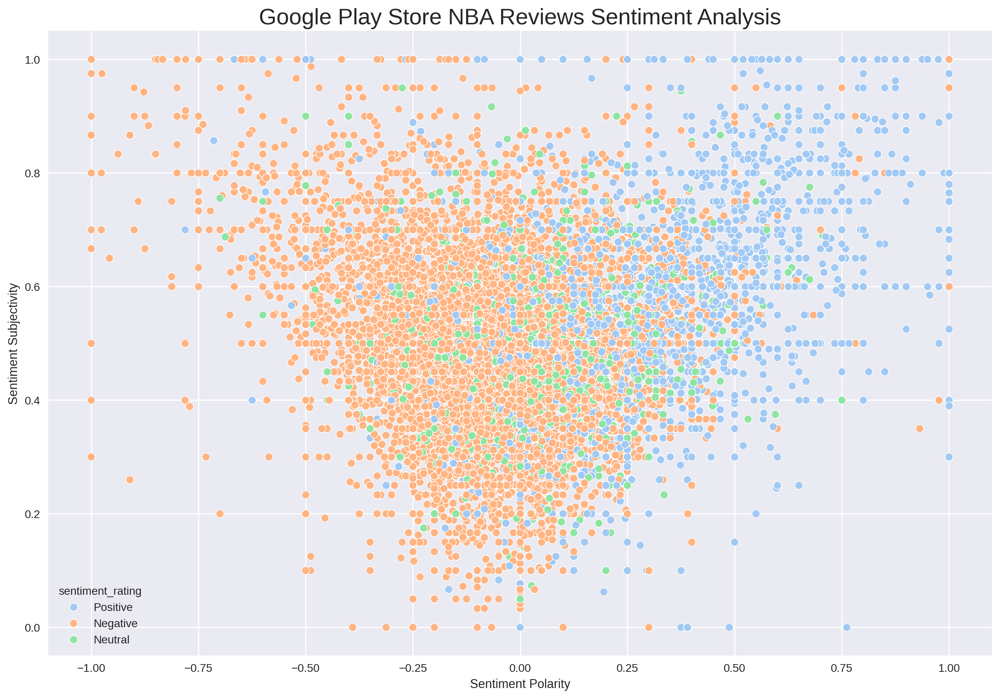

In [ ]:
# Scatter plot untuk sentiment polarity vs sentiment subjectivity
sns.scatterplot(
    x=df_nba['sentiment_polarity'],
    y=df_nba['sentiment_subjective'],
    hue=df_nba['sentiment_rating'],  # Warna berdasarkan sentimen (Positive, Neutral, Negative)
    edgecolor='white',
    palette="pastel"
)

plt.title("Google Play Store NBA Reviews Sentiment Analysis", fontsize=20)
plt.xlabel("Sentiment Polarity")
plt.ylabel("Sentiment Subjectivity")
plt.show()


Dari scatter plot analisis sentimen dari ulasan Halodoc di Google Play Stor didapatkan penjelasan :

- **Sumbu X (sentiment_polarity)**: Menunjukkan polaritas sentimen dari ulasan, dengan nilai berkisar dari -1 (sangat negatif) hingga 1 (sangat positif). Nilai mendekati 0 menunjukkan sentimen netral.

- **Sumbu Y (sentiment_subjective)**: Menunjukkan tingkat subjektivitas dari ulasan, dengan nilai berkisar dari 0 (sangat objektif) hingga 1 (sangat subjektif).

- **Warna Titik (sentiment_rating)**:
  - **Biru (Positive)**: Menunjukkan ulasan dengan sentimen positif.
  - **Oranye (Negative)**: Menunjukkan ulasan dengan sentimen negatif.
  - **Hijau (Neutral)**: Menunjukkan ulasan dengan sentimen netral.


<ipython-input-38-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


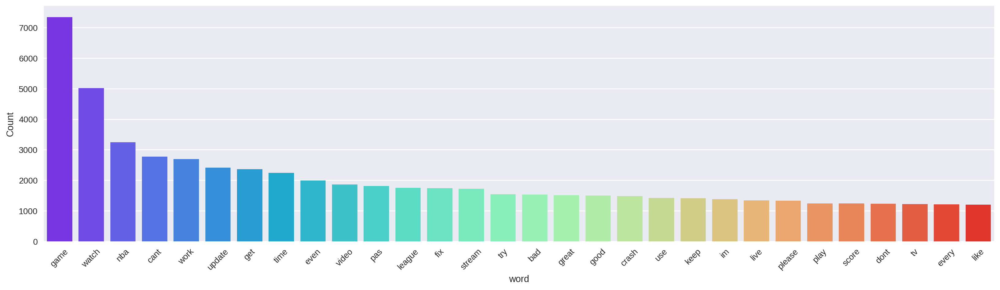

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_nba['cleaned_content'])

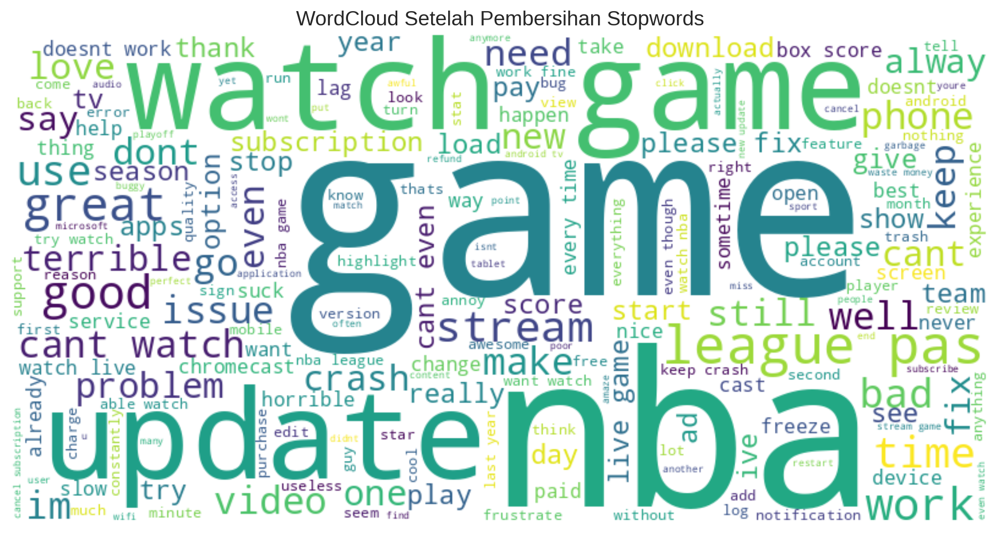

In [ ]:
# Gabungkan semua kata setelah pembersihan stopwords
all_words_after = ' '.join(df_nba['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Plot WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.title("WordCloud Setelah Pembersihan Stopwords", fontsize=14)
plt.show()

In [ ]:
from collections import Counter
import pandas as pd

def freq_words_top5(text_column, n=5):
    """
    Menghitung n kata paling sering muncul dalam kolom teks.

    Parameters:
        text_column (pd.Series): Kolom teks dalam DataFrame.
        n (int): Jumlah kata teratas yang ingin ditampilkan (default = 5).

    Returns:
        pd.DataFrame: DataFrame dengan kata dan jumlah kemunculannya.
    """
    # Pastikan kolom tidak kosong atau berisi NaN
    text_column = text_column.dropna()

    # Gabungkan semua teks menjadi satu string
    all_words = ' '.join(text_column).split()

    # Hitung jumlah kemunculan setiap kata
    word_counts = Counter(all_words)

    # Konversi ke DataFrame
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Ambil n kata dengan frekuensi tertinggi
    top_words = words_df.nlargest(columns="count", n=n)

    return top_words

# Terapkan fungsi pada DataFrame df_nba
top_5_words = freq_words_top5(df_nba['cleaned_content'], n=5)
print(top_5_words)

     word  count
12   game   7342
10  watch   5014
38    nba   3243
73   cant   2779
24   work   2698


In [ ]:
df_nba.to_csv('df_nba.csv', index=False)

## Rating Score

In [ ]:
df_nba['score'].value_counts()

,count
score,
1,8926
5,5255
2,1814
3,1358
4,1286


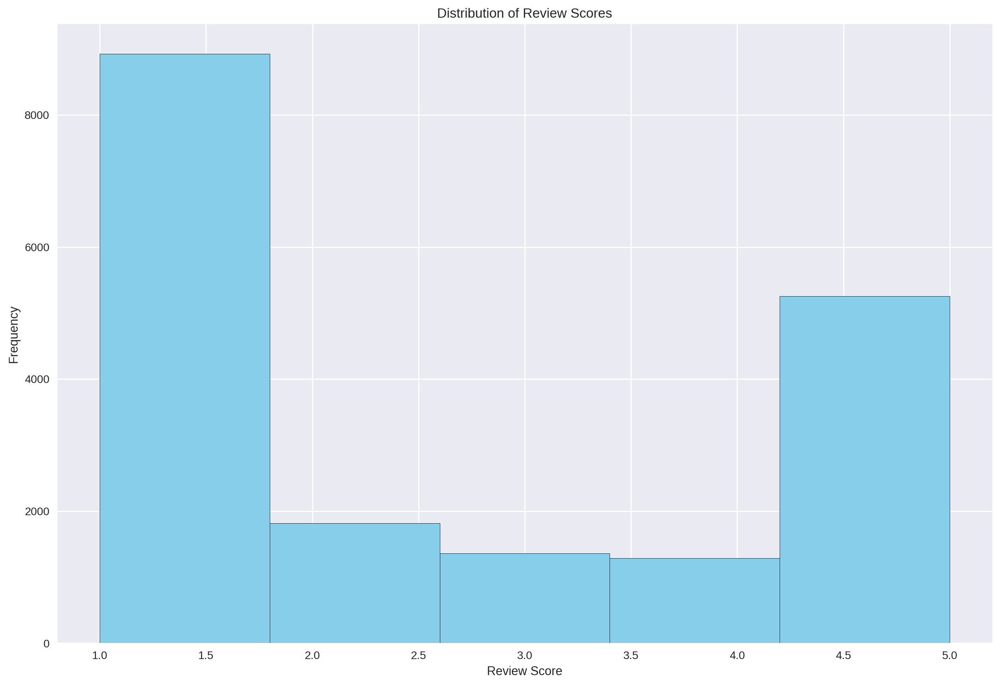

In [ ]:
import matplotlib.pyplot as plt

plt.hist(df_nba['score'], bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Review Score')
plt.ylabel('Frequency')
plt.title('Distribution of Review Scores')
plt.show()


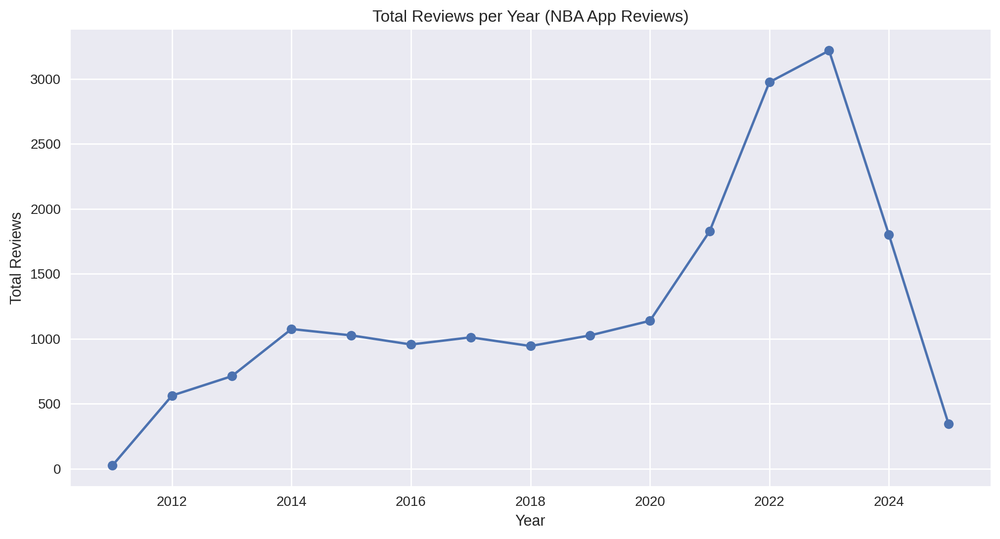

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Konversi kolom 'at' ke format datetime jika belum dalam bentuk datetime
df_nba['at'] = pd.to_datetime(df_nba['at'], errors='coerce')

# Ekstrak tahun dan bulan dari kolom 'at'
df_nba['year'] = df_nba['at'].dt.year
df_nba['month'] = df_nba['at'].dt.month

# Hitung jumlah ulasan per tahun
yearly_reviews = df_nba.groupby('year')['id'].count()

# Hitung jumlah ulasan per tahun dan bulan
monthly_reviews = df_nba.groupby(['year', 'month'])['id'].count()

# Plot jumlah ulasan per tahun
plt.figure(figsize=(12, 6))
plt.plot(yearly_reviews.index, yearly_reviews.values, marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Year (NBA App Reviews)')
plt.grid(True)
plt.show()

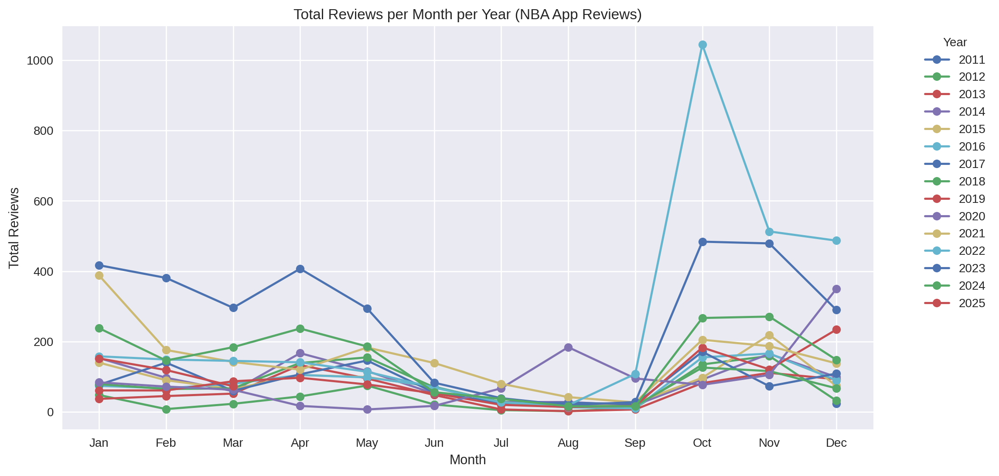

In [ ]:
# Membuat line chart untuk total ulasan per bulan per tahun
plt.figure(figsize=(12, 6))

# Loop untuk setiap tahun yang ada dalam dataset
for year in monthly_reviews.index.get_level_values(0).unique():
    year_data = monthly_reviews.loc[year]  # Ambil data berdasarkan tahun
    plt.plot(year_data.index, year_data.values, marker='o', label=str(year))

plt.xlabel('Month')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Month per Year (NBA App Reviews)')
plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left')  # Tambahkan legenda di sebelah kanan
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])  # Label bulan
plt.grid(True)
plt.show()

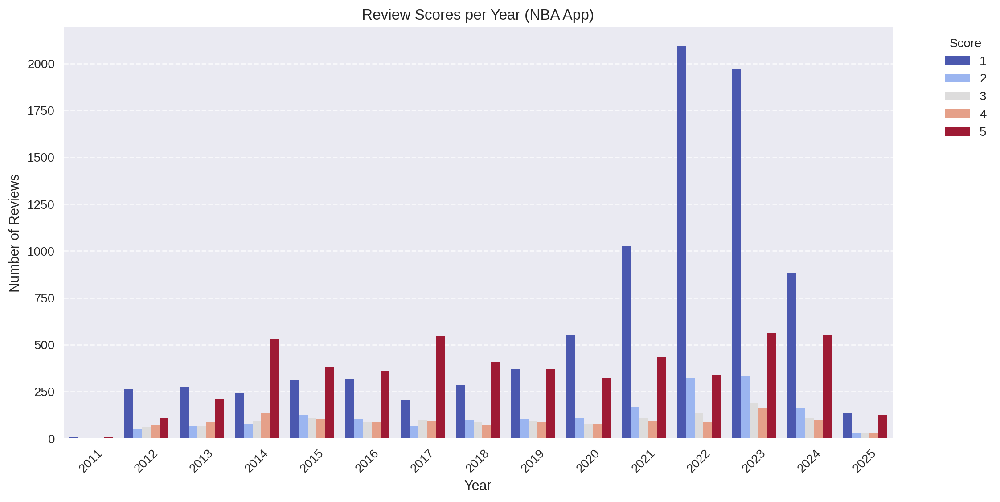

score,1,2,3,4,5
year,,,,,
2011,5,3,3,4,9
2012,265,53,62,72,111
2013,277,68,66,88,213
2014,242,75,94,136,528
2015,311,125,109,103,378
2016,317,103,89,86,361
2017,205,66,99,94,547
2018,283,95,88,71,407
2019,370,105,94,87,370


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan kolom 'at' dalam format datetime
df_nba['at'] = pd.to_datetime(df_nba['at'])

# Ekstrak tahun dari kolom 'at'
df_nba['year'] = df_nba['at'].dt.year

# Kelompokkan data berdasarkan tahun dan score, lalu hitung jumlahnya
score_per_year = df_nba.groupby(['year', 'score'])['id'].count().reset_index()

# Buat bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='year', y='id', hue='score', data=score_per_year, palette="coolwarm")

# Kustomisasi tampilan grafik
plt.xlabel('Year')
plt.ylabel('Number of Reviews')
plt.title('Review Scores per Year (NBA App)')
plt.legend(title='Score', bbox_to_anchor=(1.05, 1), loc='upper left')  # Letakkan legenda di samping kanan
plt.xticks(rotation=45)  # Rotasi label tahun agar lebih mudah dibaca
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Tambahkan grid horizontal
plt.show()

# DataFrame untuk melihat distribusi score per tahun dalam tabel
score_per_year_df = df_nba.groupby('year')['score'].value_counts().unstack(fill_value=0)
score_per_year_df

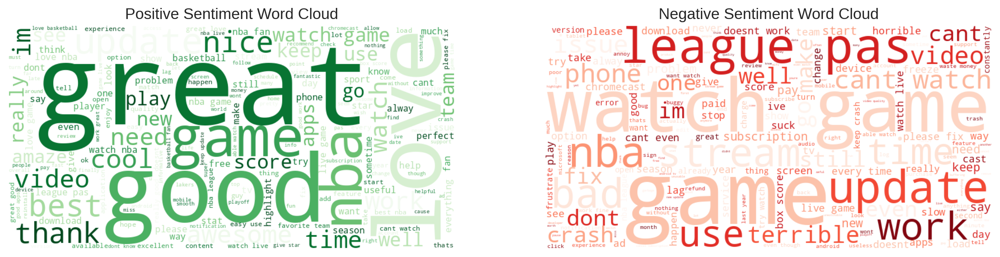

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Memisahkan ulasan positif dan negatif berdasarkan sentiment_rating
positive_reviews = df_nba[df_nba['sentiment_rating'] == 'Positive']['cleaned_content']
negative_reviews = df_nba[df_nba['sentiment_rating'] == 'Negative']['cleaned_content']

# Menggabungkan teks untuk setiap kategori
positive_text = ' '.join(positive_reviews.dropna())  # Drop NaN untuk menghindari error
negative_text = ' '.join(negative_reviews.dropna())

# Membuat wordcloud untuk masing-masing sentimen
positive_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate(positive_text)
negative_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate(negative_text)

# Menampilkan wordcloud
plt.figure(figsize=(16, 8))

# Wordcloud Sentimen Positif
plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Positive Sentiment Word Cloud", fontsize=14)

# Wordcloud Sentimen Negatif
plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Negative Sentiment Word Cloud", fontsize=14)

plt.show()